In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
from dark.dimension import dimensionalIterator
from datetime import datetime
from glob import glob
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import rasterio
from rasterio.plot import show, show_hist
from shapely.geometry import shape, mapping

from osgeo import gdal
from osgeo import ogr
from osgeo import osr

from giscode.common import NODATAVAL

# Plot reprojected, rescaled, and clipped landsat data of Zurich

## Have a look at temperature ranges in each scene:

In [62]:
data = []

for file in glob('../../data/landsat/clipped/*ST_B10-clipped.TIF'):
    ls = gdal.Open(file)
    band = ls.GetRasterBand(1)
    min, max = band.ComputeRasterMinMax(1)
    data.append([file.split('_')[3], min, max])

data = sorted(data, key=lambda x: x[0])

data = pd.DataFrame(data, columns=['date', 'min', 'max'])

data['date']= pd.to_datetime(data['date'])

Text(0.5, 0, 'Scene date')

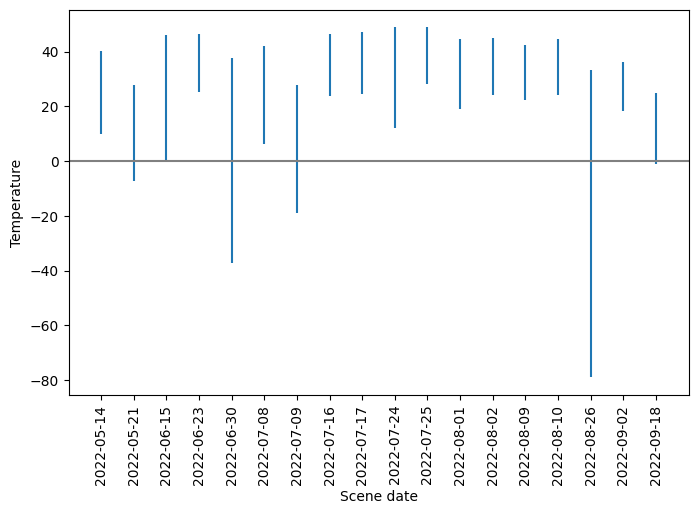

In [65]:
fig, ax = plt.subplots(figsize = (8, 5))

dates = []

for i, row in data.iterrows():
    ax.vlines(x = i, ymin = row['min'], ymax = row['max'])
    dates.append(datetime.strftime(row['date'], '%Y-%m-%d'))


ax.hlines(y = 0, xmin = -1, xmax = 18, color = 'grey')
ax.set_xticks(range(data.shape[0]))
ax.set_xticklabels(dates, rotation=90)
ax.set_xlim(-1, 18)
ax.set_ylabel('Temperature')
ax.set_xlabel('Scene date')

--> look at `20220630`, `20220709` and especially `20220918` separately.

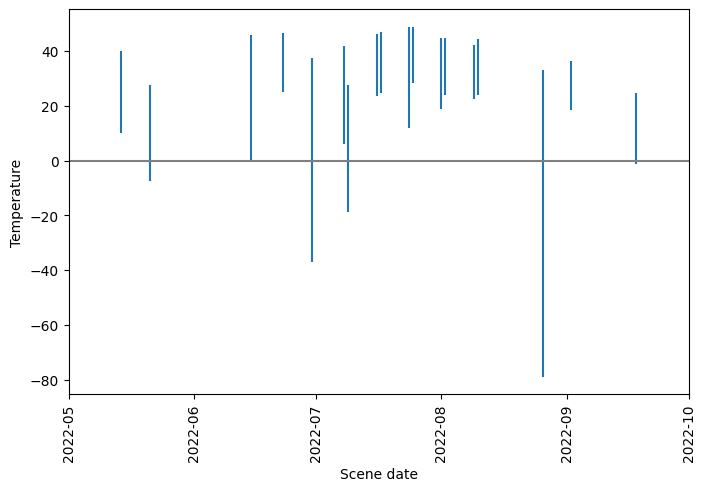

In [137]:
fig, ax = plt.subplots(figsize = (8, 5))

dates = []

for i, row in data.iterrows():
    ax.vlines(x = row['date'], ymin = row['min'], ymax = row['max'])
    dates.append(datetime.strftime(row['date'], '%Y-%m-%d'))


ax.hlines(y = 0, xmin = datetime.strptime('2022-05-01', '%Y-%m-%d'), xmax = datetime.strptime('2022-10-01', '%Y-%m-%d'), color = 'grey')
ax.set_xlim(datetime.strptime('2022-05-01', '%Y-%m-%d'), datetime.strptime('2022-10-01', '%Y-%m-%d'))
ax.set_ylabel('Temperature')
ax.set_xlabel('Scene date')
_ = plt.xticks(rotation = 90)

--> also interesting that the `20220709` and `20220708` scenes are so different even though they were taken only one day apart.

## Plot the individual scene histograms

In [127]:
files = sorted(glob('../../data/landsat/clipped/*ST_B10-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

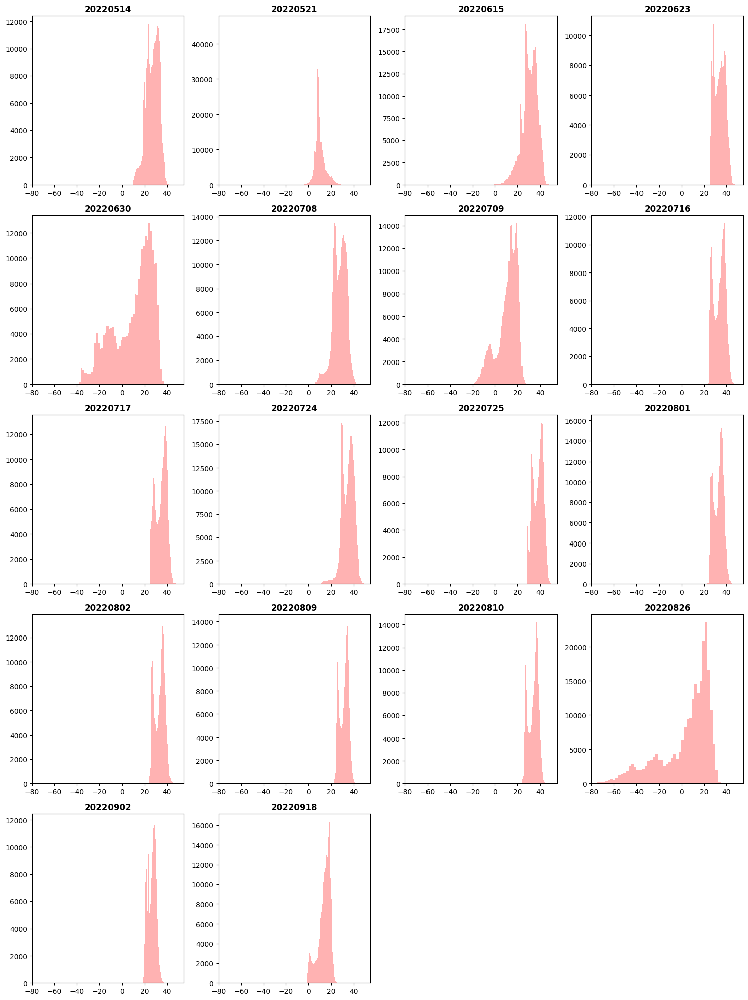

In [138]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)
    title = file.split('_')[3]
    show_hist(ls, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title=title, ax=ax[row][col])
    ax[row][col].legend().set_visible(False)
    ax[row][col].set_xlim(-80, 55)
    ax[row][col].grid(False)
    ax[row][col].set_xlabel('')
    ax[row][col].set_ylabel('')
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

## Plot the individual scenes

### Plot with individual temperature ranges

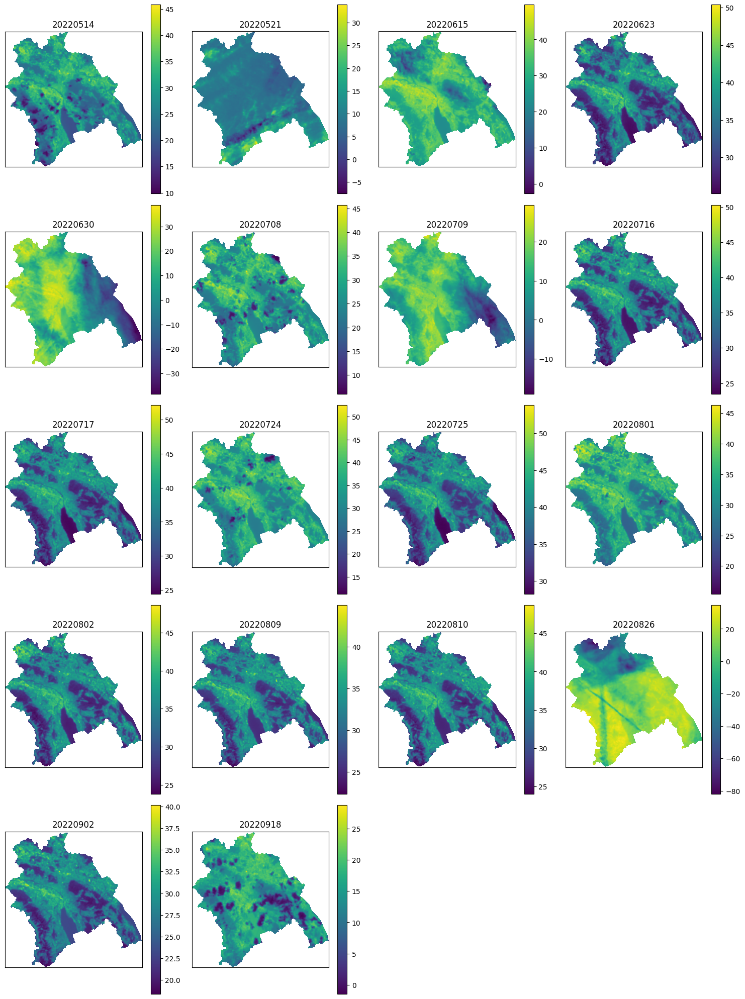

In [21]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/clipped/*ST_B10-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap='viridis')

    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    fig.colorbar(im, ax=ax[row][col])
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

### Plot with individual temperature ranges from 0-50C

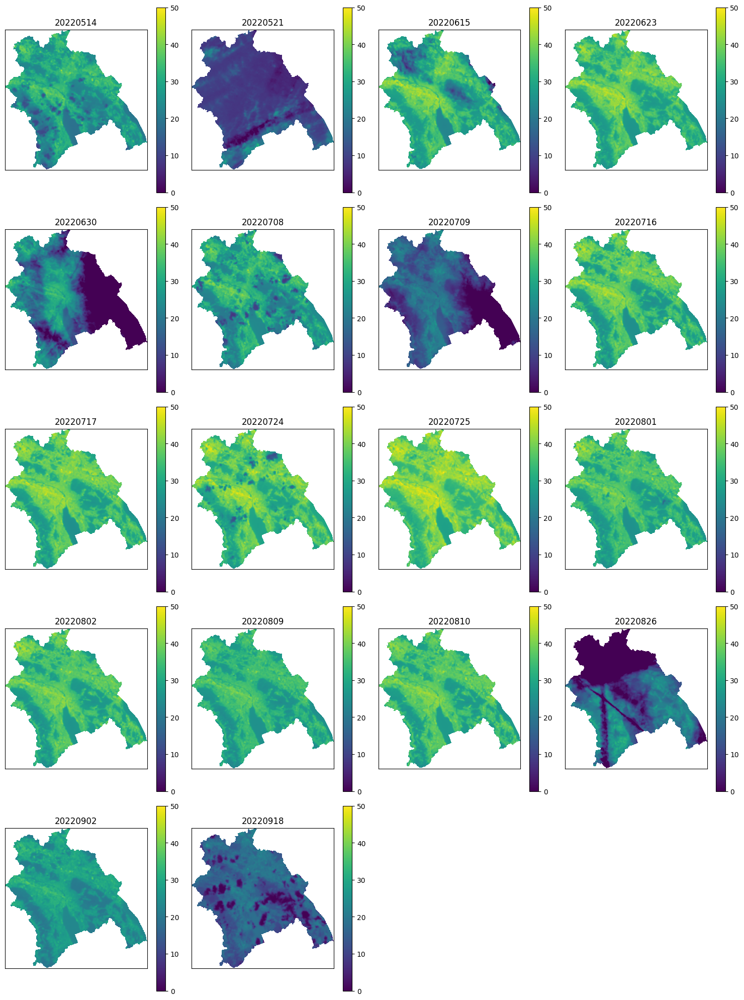

In [118]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/clipped/*ST_B10-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap='viridis', vmin=0, vmax=50)

    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    fig.colorbar(im, ax=ax[row][col])
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

plt.savefig('temperature-unmasked-scaled.png')

--> some images look a lot 'colder' than others (`220521`, `220630`, `220709`, `220826`, `220918`)

--> did `220826` have a plane going through it or something? Or is this a normal cloud?

## Plot quality data

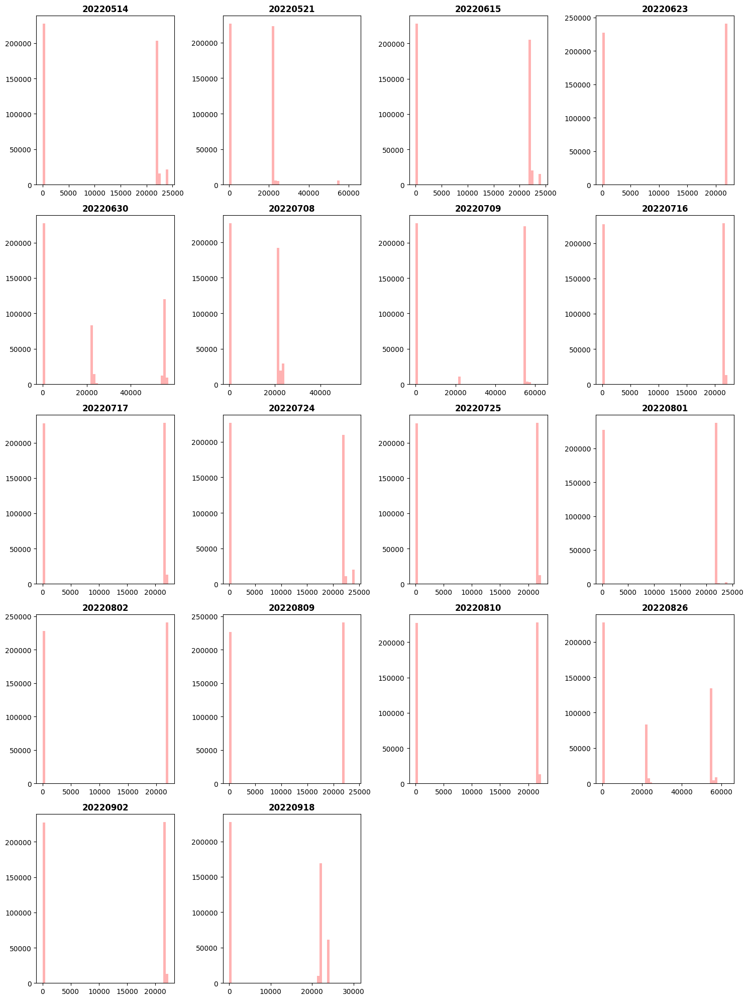

In [39]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))
s = set()
coords = dimensionalIterator((5, 4))
files = sorted(glob('../../data/landsat/clipped/*QA_PIXEL-clipped.TIF'), key = lambda x: int(x.split('_')[3]))
for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)
    s.update(set(ls.read(1).flatten()))
    title = file.split('_')[3]
    #ax[row][col].vlines(0, 0, 50000, color='black')
    show_hist(ls, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title=title, ax=ax[row][col])
    ax[row][col].legend().set_visible(False)
    #ax[row][col].set_xlim(-80, 55)
    ax[row][col].grid(False)
    ax[row][col].set_xlabel('')
    ax[row][col].set_ylabel('')
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

--> looks like only few bins are used. Figure out what they are.

In [52]:
# From https://pages.cms.hu-berlin.de/EOL/gcg_eo/02_data_quality.html
meanings = {
    0: 'Fill',
    1: 'Dilated cloud',
    2: 'Cirrus',
    3: 'Cloud',
    4: 'Cloud shadow',
    5: 'Snow',
    6: 'Clear',
    7: 'Water',
} # Let's only look at the yes/no answers

In [77]:
for nr in s:
    print(nr)
    for i, bit in enumerate(bin(nr)[9:17][::-1]):
        #print(i, bit)
        m = meanings[i]
        if bit == '1':
            print(m)
    print('\n')

0


21762
Dilated cloud


22018
Dilated cloud


21890
Dilated cloud
Water


22146
Dilated cloud
Water


54790
Fill
Dilated cloud


54534
Fill
Dilated cloud
Water


22280
Cloud


55052
Dilated cloud
Cirrus
Water


23826
Dilated cloud
Cloud shadow


24082
Dilated cloud
Cloud shadow


56854
Fill
Dilated cloud
Cloud


56598
Fill
Dilated cloud
Cloud
Water


30242
Dilated cloud
Snow


29986
Dilated cloud
Snow


63014
Fill
Dilated cloud
Cloud shadow


62758
Fill
Dilated cloud
Cloud shadow
Water


21824
Clear


22080
Clear


21952
Clear
Water


22208
Clear
Water


54596
Dilated cloud
Snow
Water


54852
Dilated cloud
Snow


23888
Cloud shadow
Clear


24144
Cloud shadow
Clear


56916
Dilated cloud
Cloud
Snow


56660
Dilated cloud
Cloud
Snow
Water


63076
Dilated cloud
Cloud shadow
Snow


62820
Dilated cloud
Cloud shadow
Snow
Water




--> let's be conservative and only use 21824 (clear) pixels.

### Plot all quality values

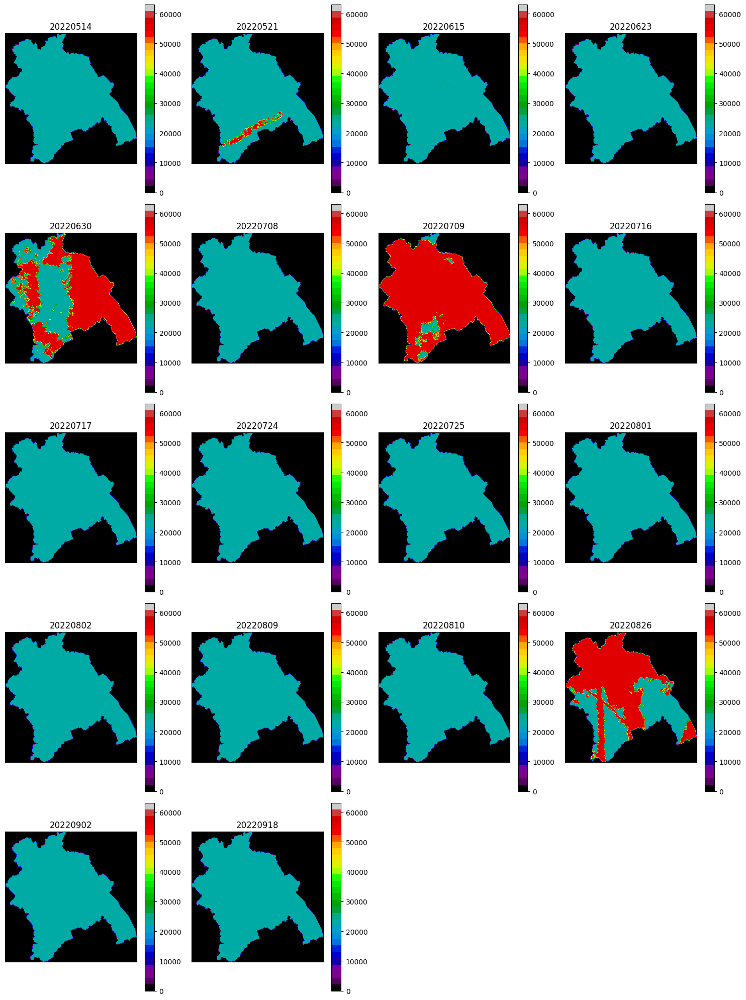

In [51]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/clipped/*QA_PIXEL-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

cmap = plt.get_cmap('nipy_spectral', 29)

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap=cmap, vmin=0, vmax=63076)

    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    fig.colorbar(im, ax=ax[row][col])
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

### Plot clear vs other quality values

/var/folders/z3/x6qjmllx6314vnr7cktm58680000gn/T/ipykernel_31928/3091657513.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  im = ax[row][col].imshow(d, cmap=plt.cm.get_cmap('tab20', 3))


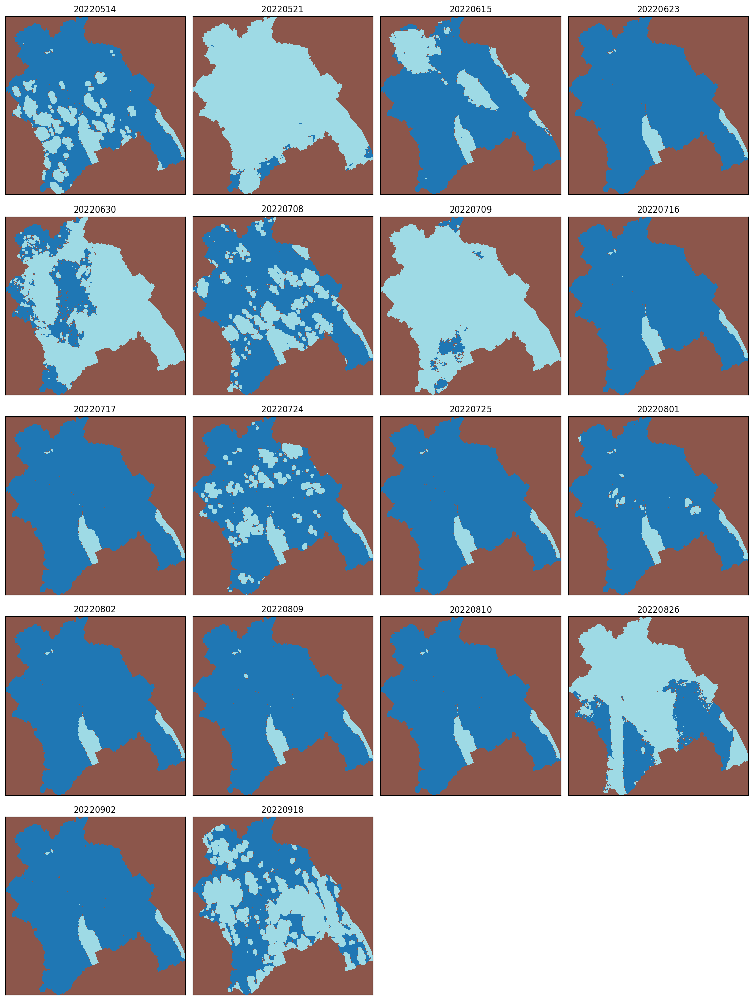

In [117]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/clipped/*QA_PIXEL-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

cmap = plt.get_cmap('nipy_spectral', 29)

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    
    # make the mask (clear pixels only)
    d[np.isin(d, [21762, 21890, 21952, 22018, 22080, 22146, 22208, 22280, 23826, 23888, 24082, 24144, 29986, 30242, 54534, 
                  54596, 54790, 54852, 55052, 56598, 56660, 56854, 56916, 62758, 62820, 63014, 63076])] = 2

    d[d == 0] = 1
    d[d == 21824] = 0
    
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap=plt.cm.get_cmap('tab20', 3))

    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

--> the darker blue is the  non-masked part. There's not much left.

### Plot on the fly masked maps

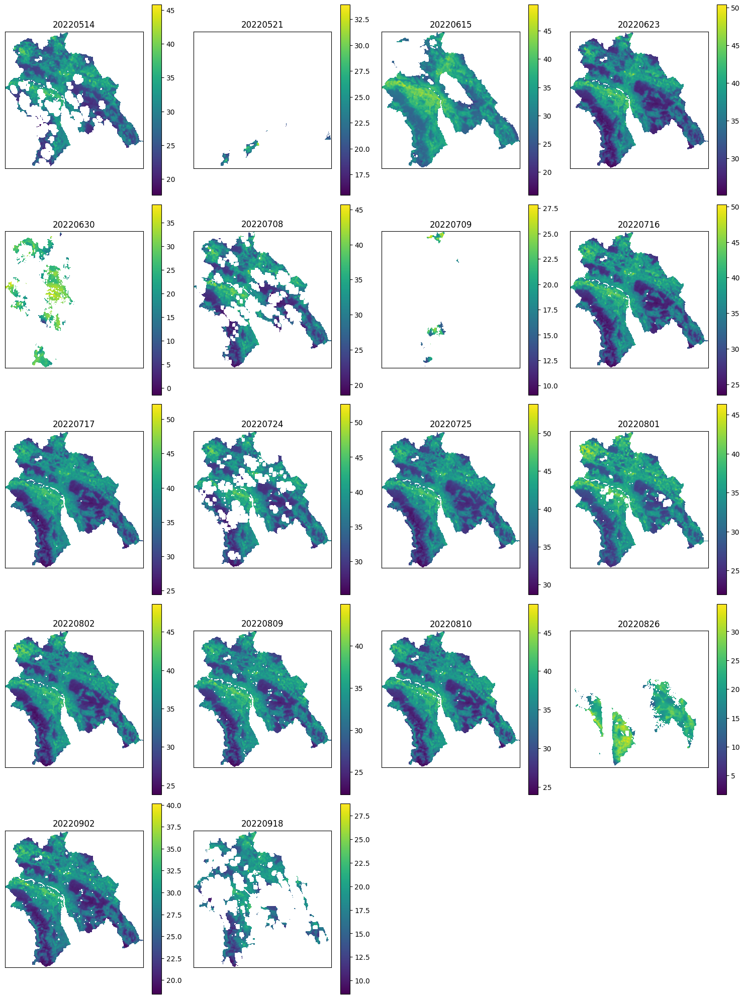

In [122]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/clipped/*ST_B10-clipped.TIF'), key = lambda x: int(x.split('_')[3]))
filesQA = sorted(glob('../../data/landsat/clipped/*QA_PIXEL-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

for i, file in enumerate(files):
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan

    # Open quality file
    qa = rasterio.open(filesQA[i])

    mask = qa.read(1)
    
    # make the mask (clear pixels only)
    mask[mask != 21824] = 1
    mask[mask == 21824] = 0

    masked = np.ma.masked_array(d, mask=mask)
    
    title = file.split('_')[3]

    im = ax[row][col].imshow(masked, cmap='viridis')

    fig.colorbar(im, ax=ax[row][col])

    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])
    ls.close()
    aq.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

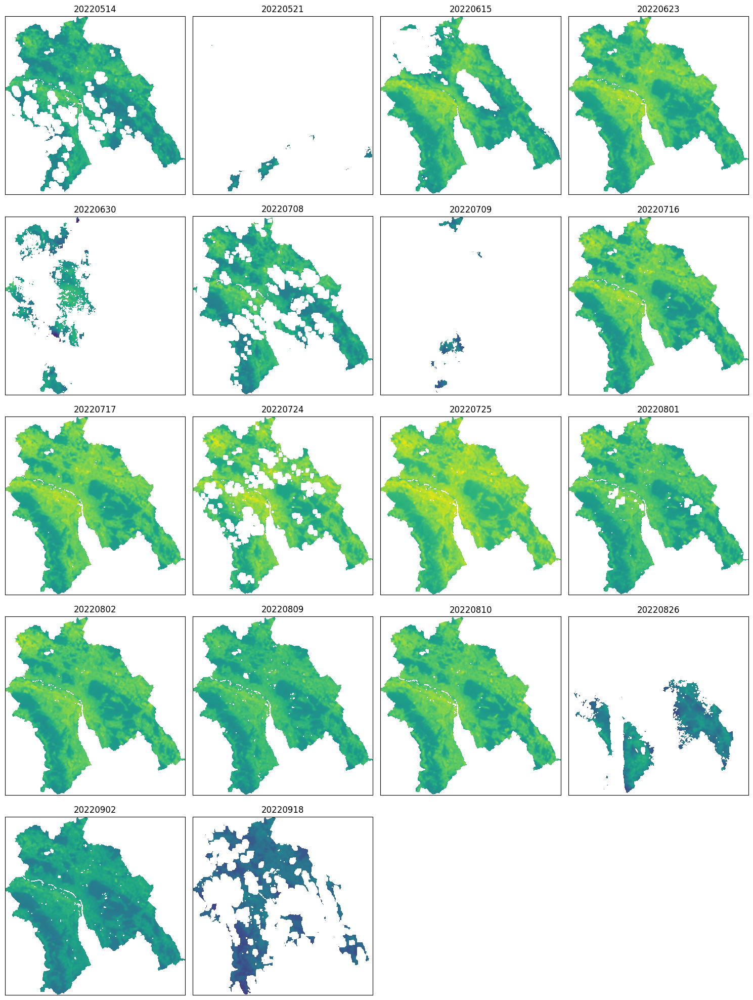

In [120]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/clipped/*ST_B10-clipped.TIF'), key = lambda x: int(x.split('_')[3]))
filesQA = sorted(glob('../../data/landsat/clipped/*QA_PIXEL-clipped.TIF'), key = lambda x: int(x.split('_')[3]))

for i, file in enumerate(files):
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan

    # Open quality file
    qa = rasterio.open(filesQA[i])

    mask = qa.read(1)
    
    # make the mask (clear pixels only)
    mask[mask != 21824] = 1
    mask[mask == 21824] = 0

    masked = np.ma.masked_array(d, mask=mask)
    
    title = file.split('_')[3]

    im = ax[row][col].imshow(masked, cmap='viridis', vmin=0, vmax=50)

    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])
    ls.close()
    qa.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

--> Some of these scenes can't be used. I guess I'll only work with `20220623`, `20220716`, `20220717`, `20220725`, `20220801`, `20220802`, `20220809`, and `20220810`, and maybe `20220902`, although the last one is cooler. 

### Plot externally masked maps (using `bin/mask-clouds.py`)

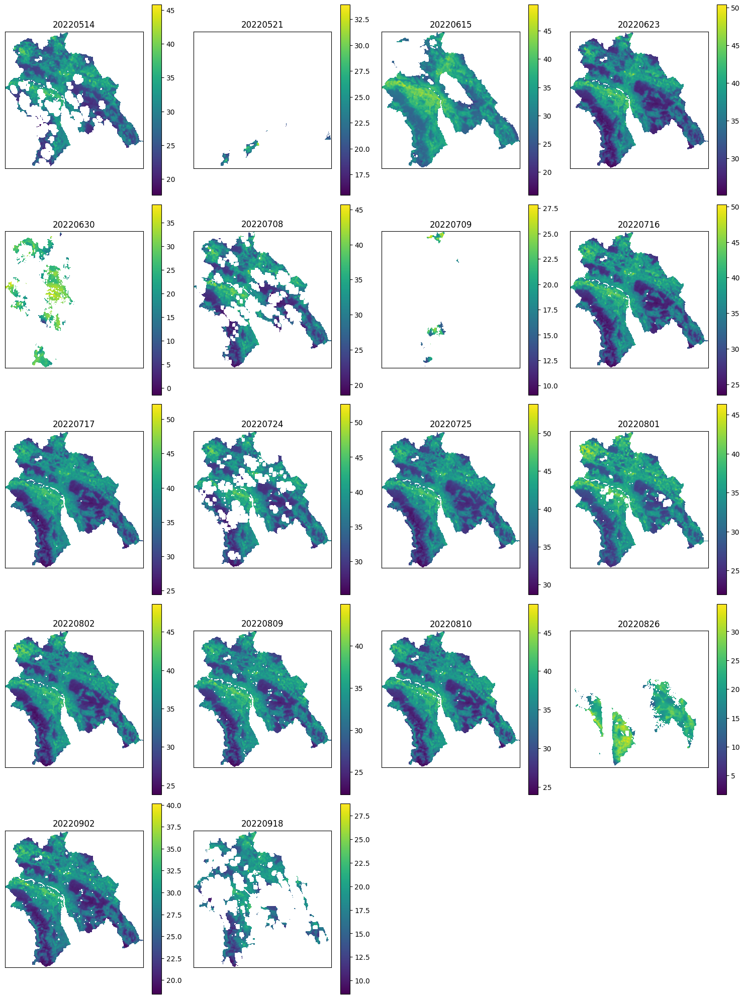

In [8]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/masked/*ST_B10-masked.TIF'), key = lambda x: int(x.split('_')[3]))

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap='viridis')
    
    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    fig.colorbar(im, ax=ax[row][col])
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

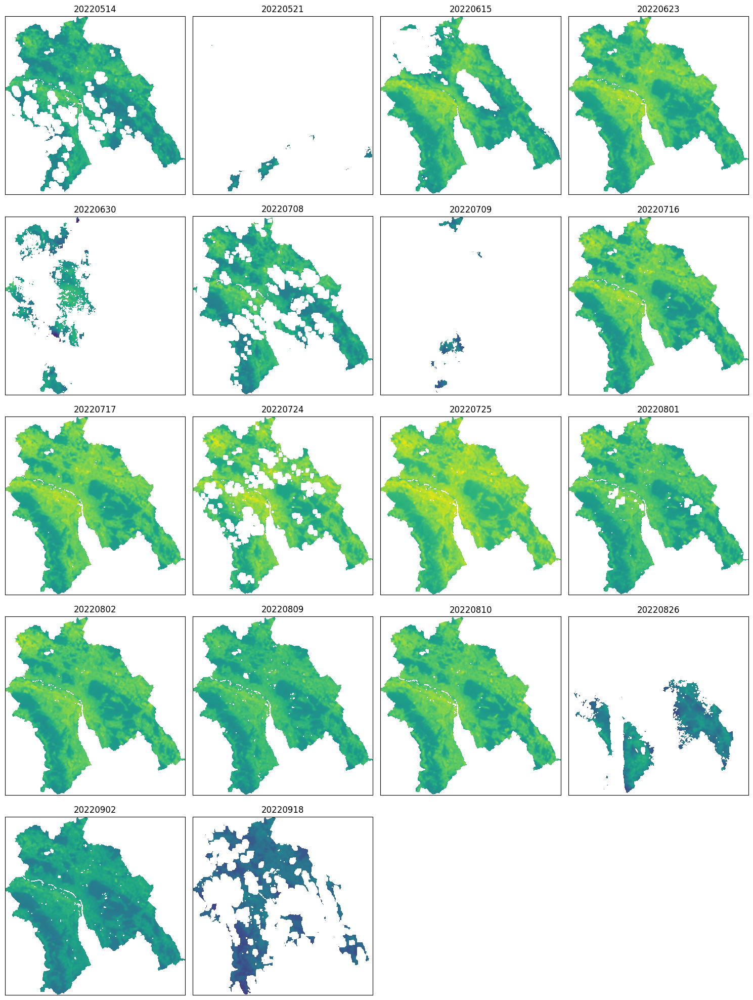

In [10]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/masked/*ST_B10-masked.TIF'), key = lambda x: int(x.split('_')[3]))

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap='viridis', vmin=0, vmax=50)
    
    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    #fig.colorbar(im, ax=ax[row][col])
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

plt.savefig('masked.png')

--> Identical to the data generated within the notebook.

# Plot temperature data with changed resolution

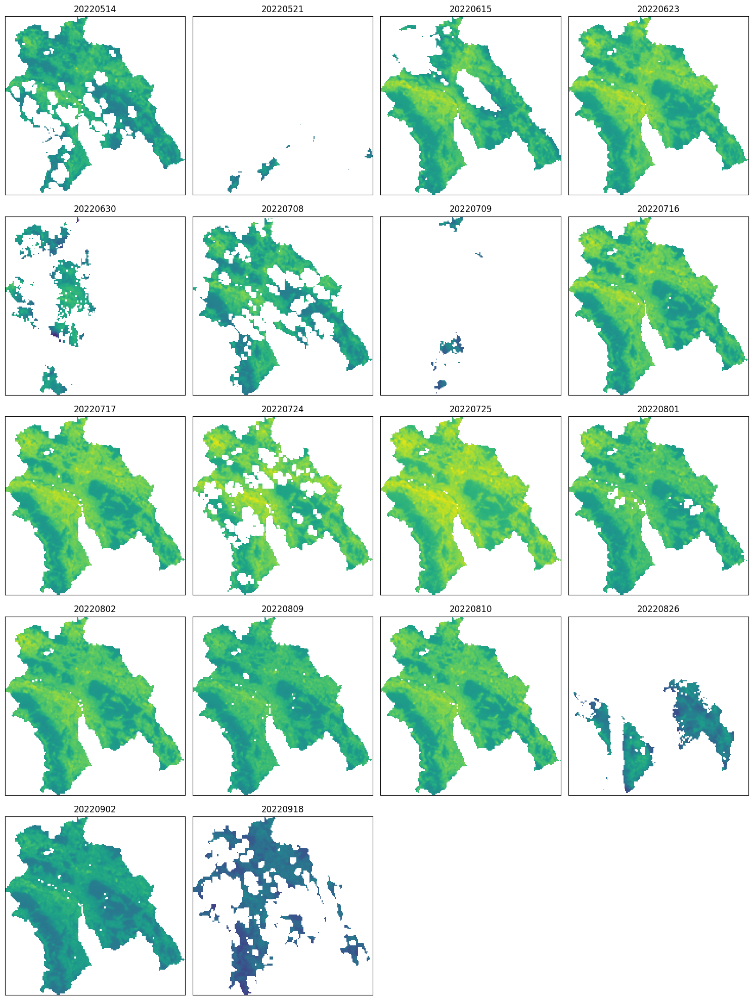

In [116]:
fig, ax = plt.subplots(5, 4, figsize = (15, 20))

coords = dimensionalIterator((5, 4))

files = sorted(glob('../../data/landsat/resolution/*ST_B10-resolution.TIF'), key = lambda x: int(x.split('_')[3]))

for file in files:
    row, col = next(coords)
    ls = rasterio.open(file)

    d = ls.read(1)
    d[d == NODATAVAL] = np.nan
    title = file.split('_')[3]

    im = ax[row][col].imshow(d, cmap='viridis', vmin=0, vmax=50)
    
    ax[row][col].set_xticks([])
    ax[row][col].set_yticks([])
    ax[row][col].set_title(file.split('_')[3])

    #fig.colorbar(im, ax=ax[row][col])
    ls.close()
    
row, col = next(coords)
ax[row][col].set_visible(False) 

row, col = next(coords)
ax[row][col].set_visible(False) 

plt.tight_layout()

In [15]:
lTot = rasterio.open('../../data/landsat/resolution/average-resolution.TIF')
d = lTot.read(1)
cityCount = len([i for i in d.flatten() if not np.isnan(i)])
lTot.close()

files = sorted(glob('../../data/landsat/resolution/*ST_B10-resolution.TIF'), key = lambda x: int(x.split('_')[3]))

for file in files:
    ls = rasterio.open(file)

    d = ls.read(1)

    print(file.split('_')[3])
    print(len([i for i in d.flatten() if i != NODATAVAL]) / cityCount)
    ls.close()

20220514
0.7954765126618983
20220521
0.033394548617823316
20220615
0.8328822733423545
20220623
0.9923641987241446
20220630
0.2659965203943553
20220708
0.7354533152909337
20220709
0.04736129905277402
20220716
0.992267543011792
20220717
0.9911560023197371
20220724
0.8183355886332883
20220725
0.9921225594432631
20220801
0.9738546298086217
20220802
0.9922192151556157
20220809
0.9904310844770926
20220810
0.9915909530253239
20220826
0.321525227140924
20220902
0.9918325923062054
20220918
0.5184129132031703


## Plot Bevölkerungsstatistik

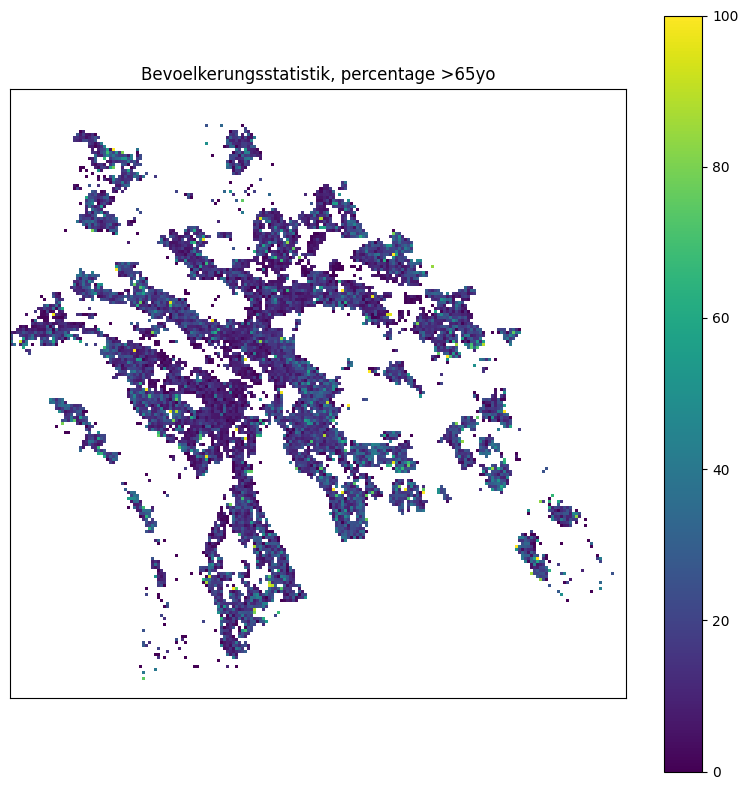

In [123]:
fig, ax = plt.subplots(figsize = (8, 8))

ls = rasterio.open('../../data/bevoelkerungsstatistik/Raumliche_Bevolkerungsstatistik_-OGD/BEVOELKERUNG_HA_P-raster-clipped.TIF')

d = ls.read(1)
d[d == NODATAVAL] = np.nan
title = file.split('_')[3]

im = ax.imshow(d, cmap='viridis', vmin=0, vmax=100)

ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Bevoelkerungsstatistik, percentage >65yo')

fig.colorbar(im, ax=ax)
ls.close()

plt.tight_layout()

--> I wonder if the places with the ~100% >65 are old peoples homes?

I checked some. Looks like many of them are.